In [408]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os

from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder
from sklearn.model_selection import GridSearchCV, train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [409]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [410]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [411]:
# Train set

In [412]:
df_train = pd.read_csv('train.csv', sep=',')

In [413]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [414]:
df_train.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [415]:
df_train.drop_duplicates().reset_index(drop=True)
df_train.head(2)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,71.2833,C85,C


In [416]:
df_train["Age"] = df_train["Age"].fillna(df_train["Age"].median())

In [417]:
df_train["Family_size"] = df_train["SibSp"]+df_train["Parch"]+1


In [418]:
df_train["IsAlone"] = (df_train["Family_size"]==1).astype(int)

In [419]:
def extract_title(name):
    match = re.search(r'\b([A-Za-z]+)\.', name)
    if match:
        return match.group(1)
    return ''

In [420]:
df_train['Title'] = df_train['Name'].apply(extract_title)
print(df_train['Title'].value_counts())

Title
Mr          517
Miss        182
Mrs         125
Master       40
Dr            7
Rev           6
Mlle          2
Major         2
Col           2
Countess      1
Capt          1
Ms            1
Sir           1
Lady          1
Mme           1
Don           1
Jonkheer      1
Name: count, dtype: int64


In [421]:
common_titles = ['Mr', 'Miss', 'Mrs', 'Master']
df_train['Title'] = df_train['Title'].apply(lambda x: x if x in common_titles else 'Rare')

In [423]:
def extract_ticket_prefix(ticket):
    # Удаляем пробелы и ищем буквенно-цифровой префикс перед последними цифрами
    ticket_str = str(ticket).strip()
    
    # Если есть точка, используем её как разделитель
    if '.' in ticket_str:
        parts = ticket_str.split('.')
        if len(parts) > 0 and not parts[0].isdigit():
            return parts[0].strip()
    
    # Ищем последовательность букв и цифр в начале
    match = re.match(r'^([A-Za-z]+/?\d*)', ticket_str)
    if match:
        return match.group(1)
    # Если билет состоит только из цифр
    elif ticket_str.isdigit():
        return 'NUM'
    else:
        return ticket_str.split(' ')[0] if ' ' in ticket_str else 'UNKNOWN'

df_train['TicketPrefix'] = df_train['Ticket'].apply(extract_ticket_prefix)

# Посмотрим на уникальные префиксы
print(df_train['TicketPrefix'].value_counts().head(10))

TicketPrefix
NUM         661
PC           60
C            33
A/5          17
CA           14
S            14
STON/O 2     12
SC/          12
W            10
SOTON/        9
Name: count, dtype: int64


In [424]:
def extract_deck(cabin):
    if pd.isna(cabin):
        return 'U'  # Unknown
    # Берем первую букву, переводим в верхний регистр
    deck = str(cabin)[0].upper()
    return deck if deck.isalpha() else 'U'

df_train['Deck'] = df_train['Cabin'].apply(extract_deck)

# Распределение по палубам
print(df_train['Deck'].value_counts())

Deck
U    687
C     59
B     47
D     33
E     32
A     15
F     13
G      4
T      1
Name: count, dtype: int64


In [425]:
df_train["Embarked"] = df_train["Embarked"].fillna(df_train["Embarked"].mode()[0])

In [426]:
encoder_train = OrdinalEncoder()
df_train[["Sex","Embarked", "Title", "TicketPrefix", "Deck"]] = encoder_train.fit_transform(df_train[["Sex","Embarked", "Title", "TicketPrefix", "Deck"]])

In [427]:
df_train = df_train.drop(["Name", "Ticket", "Cabin"], axis=1).reset_index(drop=True)

In [428]:
df_train.head(3)

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Family_size,IsAlone,Title,TicketPrefix,Deck
0,1,0,3,1.0,22.0,1,0,7.2500,2.0,2,0,2.0,3.0,8.0
1,2,1,1,0.0,38.0,1,0,71.2833,0.0,2,0,3.0,12.0,2.0
2,3,1,3,0.0,26.0,0,0,7.9250,2.0,1,1,1.0,22.0,8.0


In [429]:
#Модели

In [430]:
X = df_train.drop(["Survived"], axis=1)
y = df_train["Survived"]
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, stratify=None)

In [431]:
X.isnull().sum()

PassengerId     0
Pclass          0
Sex             0
Age             0
SibSp           0
Parch           0
Fare            0
Embarked        0
Family_size     0
IsAlone         0
Title           0
TicketPrefix    0
Deck            0
dtype: int64

In [432]:
def predict_results(model, X_train, X_valid, y_train, y_valid):
    
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_valid)
    
    accuracy = accuracy_score(y_valid, y_pred)  
    precision = precision_score(y_valid, y_pred)
    recall = recall_score(y_valid, y_pred)
    f1 = f1_score(y_valid, y_pred)

    print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}")
    
    ConfusionMatrixDisplay.from_estimator(model, X_valid, y_valid)
    plt.show()

In [433]:
from sklearn.ensemble import HistGradientBoostingClassifier

In [434]:
hgbc_model = HistGradientBoostingClassifier(
    max_iter=100,
    random_state=42,
    min_samples_leaf= 2,
    max_depth=15,
    categorical_features="from_dtype"
)

In [435]:
param_grid = {
    'max_iter': [50, 100, 150, 200, 250, 300],
    'max_depth': list(range(6, 16)),
    'min_samples_leaf': [5, 10, 20],
    'l2_regularization': [0, 0.01, 0.1, 1.0],
    'max_bins': [128, 255],
    'max_leaf_nodes': [15, 31, 63],
    'learning_rate': [0.01, 0.1, 0.2]
}

grid_search = GridSearchCV(
estimator=hgbc_model,
param_grid=param_grid,
cv=5, 
scoring='accuracy',
verbose=2,
n_jobs=-1, 
return_train_score=True
)

# Запуск поиска
grid_search.fit(X, y)

# Получение лучшей модели и параметров
best_hgbc_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Лучшие параметры: {best_params}")
print(f"Лучшая кросс-валидационная точность: {grid_search.best_score_:.4f}")

Fitting 5 folds for each of 12960 candidates, totalling 64800 fits
[CV] END l2_regularization=0, learning_rate=0.01, max_bins=128, max_depth=6, max_iter=50, max_leaf_nodes=15, min_samples_leaf=10; total time=   0.0s
[CV] END l2_regularization=0, learning_rate=0.01, max_bins=128, max_depth=6, max_iter=50, max_leaf_nodes=15, min_samples_leaf=5; total time=   0.0s
[CV] END l2_regularization=0, learning_rate=0.01, max_bins=128, max_depth=6, max_iter=50, max_leaf_nodes=15, min_samples_leaf=5; total time=   0.0s
[CV] END l2_regularization=0, learning_rate=0.01, max_bins=128, max_depth=6, max_iter=50, max_leaf_nodes=15, min_samples_leaf=5; total time=   0.0s
[CV] END l2_regularization=0, learning_rate=0.01, max_bins=128, max_depth=6, max_iter=50, max_leaf_nodes=15, min_samples_leaf=10; total time=   0.0s
[CV] END l2_regularization=0, learning_rate=0.01, max_bins=128, max_depth=6, max_iter=50, max_leaf_nodes=15, min_samples_leaf=5; total time=   0.0s
[CV] END l2_regularization=0, learning_rate

Accuracy: 0.7989, Precision: 0.8167, Recall: 0.6622, F1-score: 0.7313


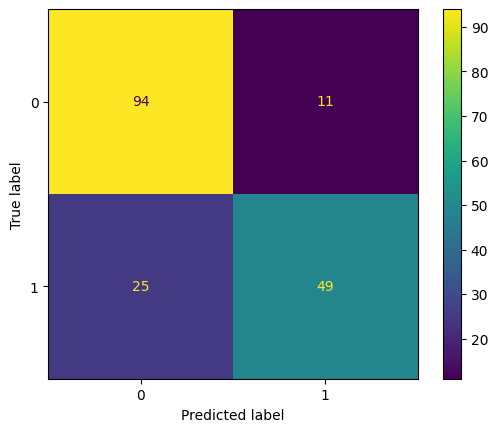

In [436]:
predict_results(best_hgbc_model, X_train, X_valid, y_train, y_valid)

In [459]:
# Test df

In [460]:
df_test = pd.read_csv('test.csv', sep=',')

In [461]:
df_test.info()
df_test.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  418 non-null    int64  
 1   Pclass       418 non-null    int64  
 2   Name         418 non-null    object 
 3   Sex          418 non-null    object 
 4   Age          332 non-null    float64
 5   SibSp        418 non-null    int64  
 6   Parch        418 non-null    int64  
 7   Ticket       418 non-null    object 
 8   Fare         417 non-null    float64
 9   Cabin        91 non-null     object 
 10  Embarked     418 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 36.1+ KB


PassengerId      0
Pclass           0
Name             0
Sex              0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64

In [462]:
df_test.drop_duplicates().reset_index(drop=True)
df_test.head(2)

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S


In [463]:
df_test["Age"] = df_test["Age"].fillna(df_train["Age"].median())

In [464]:
df_test["Family_size"] = df_test["SibSp"]+df_test["Parch"]+1

In [465]:
df_test["IsAlone"] = (df_test["Family_size"]==1).astype(int)

In [466]:
df_test["Embarked"] = df_test["Embarked"].fillna(df_test["Embarked"].mode()[0])

In [467]:
df_test["Fare"] = df_test["Fare"].fillna(df_test["Fare"].median())

In [468]:
def extract_title(name):
    match = re.search(r'\b([A-Za-z]+)\.', name)
    if match:
        return match.group(1)
    return ''

In [469]:
df_test['Title'] = df_test['Name'].apply(extract_title)
print(df_test['Title'].value_counts())

Title
Mr        240
Miss       78
Mrs        72
Master     21
Col         2
Rev         2
Ms          1
Dr          1
Dona        1
Name: count, dtype: int64


In [470]:
common_titles = ['Mr', 'Miss', 'Mrs', 'Master']
df_test['Title'] = df_test['Title'].apply(lambda x: x if x in common_titles else 'Rare')

In [471]:
def extract_ticket_prefix(ticket):
    # Удаляем пробелы и ищем буквенно-цифровой префикс перед последними цифрами
    ticket_str = str(ticket).strip()
    
    # Если есть точка, используем её как разделитель
    if '.' in ticket_str:
        parts = ticket_str.split('.')
        if len(parts) > 0 and not parts[0].isdigit():
            return parts[0].strip()
    
    # Ищем последовательность букв и цифр в начале
    match = re.match(r'^([A-Za-z]+/?\d*)', ticket_str)
    if match:
        return match.group(1)
    # Если билет состоит только из цифр
    elif ticket_str.isdigit():
        return 'NUM'
    else:
        return ticket_str.split(' ')[0] if ' ' in ticket_str else 'UNKNOWN'

df_test['TicketPrefix'] = df_test['Ticket'].apply(extract_ticket_prefix)

# Посмотрим на уникальные префиксы
print(df_test['TicketPrefix'].value_counts().head(10))

TicketPrefix
NUM        296
PC          32
C           22
SC/         10
SOTON/O      8
CA           8
S            7
F            6
W            6
A/5          5
Name: count, dtype: int64


In [472]:
def extract_deck(cabin):
    if pd.isna(cabin):
        return 'U'  # Unknown
    # Берем первую букву, переводим в верхний регистр
    deck = str(cabin)[0].upper()
    return deck if deck.isalpha() else 'U'

df_test['Deck'] = df_test['Cabin'].apply(extract_deck)

# Распределение по палубам
print(df_test['Deck'].value_counts())

Deck
U    327
C     35
B     18
D     13
E      9
F      8
A      7
G      1
Name: count, dtype: int64


In [473]:
encoder_test = OrdinalEncoder()
df_test[["Sex","Embarked", "Title", "TicketPrefix", "Deck"]] = encoder_test.fit_transform(df_test[["Sex","Embarked", "Title", "TicketPrefix", "Deck"]])

In [474]:
df_test = df_test.drop(["Name", "Ticket", "Cabin"], axis=1).reset_index(drop=True)

In [475]:
df_test.head(2)

,PassengerId,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Family_size,IsAlone,Title,TicketPrefix,Deck
0,892,3,1.0,34.5,0,0,7.8292,1.0,1,1,2.0,9.0,7.0
1,893,3,0.0,47.0,1,0,7.0000,2.0,2,0,3.0,9.0,7.0


In [476]:
predictions = best_hgbc_model.predict(df_test)
df_test["Survived"] = predictions

In [479]:
df_test.head(1)

,PassengerId,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Family_size,IsAlone,Title,TicketPrefix,Deck,Survived
0,892,3,1.0,34.5,0,0,7.8292,1.0,1,1,2.0,9.0,7.0,0


In [480]:
result = df_test[["PassengerId", "Survived"]]

In [481]:
final_variant = result.sort_values(by="PassengerId")

In [482]:
final_variant.to_csv('submission.csv', index=False)